In [63]:
from pygltflib import GLTF2

# Load the GLTF file
gltf = GLTF2().load("my_file.gltf")

# Access bounding coordinates from 'accessors'
for accessor in gltf.accessors:
    if accessor.name == 'Positions':
        max_xyz = accessor.max
        min_xyz = accessor.min
        print(f"Bounding Coordinates: Max XYZ: {max_xyz}, Min XYZ: {min_xyz}")

# Access dynamic positioning from 'nodes'
for node in gltf.nodes:
    if hasattr(node, "extensions") and node.extensions:
        ext_mesh_gpu_instancing = node.extensions.get('EXT_mesh_gpu_instancing', {})
        attributes = ext_mesh_gpu_instancing.get('attributes', {})
        translation_accessor_index = attributes.get('TRANSLATION', None)

        if translation_accessor_index is not None:
            translation_accessor = gltf.accessors[translation_accessor_index]
            print(f"Dynamic Positioning Data: {translation_accessor}")


Bounding Coordinates: Max XYZ: [0.5, 0.5, 0.5], Min XYZ: [-0.5, -0.5, -0.5]
Dynamic Positioning Data: Accessor(extensions={}, extras={}, bufferView=3, byteOffset=0, componentType=5126, normalized=False, count=4, type='VEC3', sparse=None, max=[], min=[], name='Instance Translations')


In [13]:
from pygltflib import GLTF2

# Load the GLB file
gltf = GLTF2().load("our_file.gltf")

# Access bounding coordinates from 'accessors'
for accessor in gltf.accessors:
    if accessor.name == 'Positions':
        max_xyz = accessor.max
        min_xyz = accessor.min
        print(f"Bounding Coordinates: Max XYZ: {max_xyz}, Min XYZ: {min_xyz}")

# Access dynamic positioning from 'nodes'
for node in gltf.nodes:
    if hasattr(node, "extensions") and node.extensions:
        ext_mesh_gpu_instancing = node.extensions.get('EXT_mesh_gpu_instancing', {})
        attributes = ext_mesh_gpu_instancing.get('attributes', {})
        translation_accessor_index = attributes.get('TRANSLATION', None)

        if translation_accessor_index is not None:
            translation_accessor = gltf.accessors[translation_accessor_index]
            print(f"Dynamic Positioning Data: {translation_accessor}")


FileNotFoundError: [Errno 2] No such file or directory: 'our_file.gltf'

In [9]:
from pygltflib import GLTF2

# Load the GLB file
gltf = GLTF2().load("PeterHeadSimpleHairMesh.glb")
count=0

# Print all accessor names
print("Accessor Names:")
for accessor in gltf.accessors:
    count+=1
    print(accessor)
    # print(accessor.name if accessor.name else "Unnamed")

# Print all node extensions
# print("\nNode Extensions:")
for node in gltf.nodes:
    print(node.extensions if node.extensions else "No extensions")
    print(count)


Accessor Names:
Accessor(extensions={}, extras={}, bufferView=0, byteOffset=0, componentType=5126, normalized=False, count=66684, type='VEC3', sparse=None, max=[0.11225306242704391, 0.36381393671035767, 0.09501559287309647], min=[-0.11182139813899994, 0.1445363461971283, -0.12993088364601135], name=None)
Accessor(extensions={}, extras={}, bufferView=1, byteOffset=0, componentType=5126, normalized=False, count=66684, type='VEC3', sparse=None, max=[], min=[], name=None)
Accessor(extensions={}, extras={}, bufferView=2, byteOffset=0, componentType=5126, normalized=False, count=66684, type='VEC2', sparse=None, max=[], min=[], name=None)
Accessor(extensions={}, extras={}, bufferView=3, byteOffset=0, componentType=5125, normalized=False, count=193884, type='SCALAR', sparse=None, max=[], min=[], name=None)
Accessor(extensions={}, extras={}, bufferView=4, byteOffset=0, componentType=5126, normalized=False, count=2688, type='VEC3', sparse=None, max=[0.04075399413704872, 0.2543610632419586, 0.088

In [73]:
from pygltflib import GLTF2

# Load the GLB file
gltf = GLTF2().load("PeterHeadSimpleHairMesh.glb")

# Loop through all accessors to find VEC3 type (usually contains XYZ coordinates)
for i, accessor in enumerate(gltf.accessors):
    if accessor.type == 'VEC3':
        print(f"Accessor Index: {i}, Max: {accessor.max}, Min: {accessor.min}")


Accessor Index: 0, Max: [0.11225306242704391, 0.36381393671035767, 0.09501559287309647], Min: [-0.11182139813899994, 0.1445363461971283, -0.12993088364601135]
Accessor Index: 1, Max: [], Min: []
Accessor Index: 4, Max: [0.04075399413704872, 0.2543610632419586, 0.08832619339227676], Min: [-0.050097595900297165, 0.23727616667747498, 0.06565658748149872]
Accessor Index: 5, Max: [], Min: []
Accessor Index: 8, Max: [0.052283529192209244, 0.27217963337898254, 0.09356038272380829], Min: [-0.05787953734397888, 0.2520189881324768, 0.054810360074043274]
Accessor Index: 9, Max: [], Min: []
Accessor Index: 12, Max: [0.03207062557339668, 0.20189107954502106, 0.09110941737890244], Min: [-0.043457888066768646, 0.18560375273227692, 0.06987262517213821]
Accessor Index: 13, Max: [], Min: []
Accessor Index: 16, Max: [0.06632816791534424, 0.06636206805706024, 0.06612695008516312], Min: [-0.07699330151081085, -0.08835378289222717, -0.05745876953005791]
Accessor Index: 17, Max: [], Min: []
Accessor Index: 2

In [1]:
import trimesh

# Load the GLTF file
mesh = trimesh.load("PeterHeadSimpleHairMesh.glb")

# Show the mesh
mesh.show()


In [12]:
import numpy as np
from pygltflib import GLTF2

def load_glb_buffer(glb_path):
    with open(glb_path, "rb") as f:
        # Read the header (12 bytes)
        header = f.read(12)
        magic, version, length = header[0:4], header[4:8], header[8:12]
        # Read the JSON chunk header (8 bytes)
        chunk_header = f.read(8)
        chunk_length, chunk_type = chunk_header[0:4], chunk_header[4:8]
        chunk_length = int.from_bytes(chunk_length, byteorder="little")
        # Read the JSON chunk data
        json_data = f.read(chunk_length)
        # Read the binary chunk header (8 bytes)
        chunk_header = f.read(8)
        chunk_length, chunk_type = chunk_header[0:4], chunk_header[4:8]
        chunk_length = int.from_bytes(chunk_length, byteorder="little")
        # Read the binary chunk data
        binary_data = f.read(chunk_length)
    return binary_data

# Load the GLTF model
gltf = GLTF2().load("PeterHeadSimpleHairMesh.glb")
binary_data = load_glb_buffer("PeterHeadSimpleHairMesh.glb")

# Decode byte data to float array
bufferViewIndex = gltf.accessors[0].bufferView
bufferView = gltf.bufferViews[bufferViewIndex]
vertex_data = np.frombuffer(binary_data[bufferView.byteOffset:bufferView.byteOffset + bufferView.byteLength], np.float32)

# Reshape vertex data
vertex_data = vertex_data.reshape((-1, 3))

# Find min and max values for x and y
min_x = np.min(vertex_data[:, 0])
max_x = np.max(vertex_data[:, 0])
min_y = np.min(vertex_data[:, 1])
max_y = np.max(vertex_data[:, 1])



# width, height = 100, 100  # Change dimensions as needed
# z_values = np.full((width, height), np.inf)

# # Populate the 2D array with min z-values
# for vertex in vertex_data:
#     x, y, z = vertex
#     x_idx = int((x - min_x) / (max_x - min_x) * (width - 1))
#     y_idx = int((y - min_y) / (max_y - min_y) * (height - 1))
    
#     # Store the minimum z-value for each (x, y) index pair
#     z_values[x_idx, y_idx] = min(z_values[x_idx, y_idx], z)

# # Replace infinity values with some default if needed
# z_values[z_values == np.inf] = 0  # Or another value



width, height = 150, 150  # Change dimensions as needed
z_values = np.full((width, height), -np.inf)

# Populate the 2D array with max z-values
for vertex in vertex_data:
    x, y, z = vertex
    print("x: "+str(x)+" y: "+str(y)+" z: "+str(z))
    x_idx = int((x - min_x) / (max_x - min_x) * (width - 1))
    y_idx = int((y - min_y) / (max_y - min_y) * (height - 1))
    
    # Store the maximum z-value for each (x, y) index pair
    z_values[x_idx, y_idx] = max(z_values[x_idx, y_idx], z)

# Replace negative infinity values with some default if needed
z_values[z_values == -np.inf] = 0






# Initialize a 2D array to hold z-values
# width, height = 100, 100  # Change dimensions as needed
# z_values = np.zeros((width, height))

# # Populate the 2D array with z-values
# for vertex in vertex_data:
#     x, y, z = vertex
#     # Transform x, y to array indices
#     x_idx = int((x - min_x) / (max_x - min_x) * (width - 1))
#     y_idx = int((y - min_y) / (max_y - min_y) * (height - 1))
#     z_values[x_idx, y_idx] = z

# Save as .npy file
np.save('z_values.npy', z_values)
#print(z_values)


x: 0.014005178 y: 0.19484283 z: -0.08249676
x: 0.0042253444 y: 0.19484283 z: -0.077023596
x: 0.014427511 y: 0.19349323 z: -0.081662826
x: 0.004806766 y: 0.1931584 z: -0.07606395
x: 0.014679734 y: 0.19196849 z: -0.08136097
x: 0.00524407 y: 0.19101404 z: -0.075659834
x: 0.014832435 y: 0.19004074 z: -0.08138995
x: 0.0055668377 y: 0.18865165 z: -0.075765654
x: 0.014880229 y: 0.18778041 z: -0.08173703
x: 0.005816735 y: 0.18610233 z: -0.07627642
x: 0.014842521 y: 0.1852778 z: -0.08240765
x: 0.005982043 y: 0.18339185 z: -0.07713598
x: 0.014674544 y: 0.18258396 z: -0.08337095
x: 0.006107247 y: 0.18056247 z: -0.078352
x: 0.014419654 y: 0.17964561 z: -0.08470204
x: 0.0061473604 y: 0.17771463 z: -0.07984639
x: 0.014190447 y: 0.17647453 z: -0.085813485
x: 0.0063047954 y: 0.17474408 z: -0.08113731
x: 0.013947372 y: 0.17369829 z: -0.08678278
x: 0.0064418716 y: 0.17179988 z: -0.08245565
x: 0.013514853 y: 0.17165777 z: -0.08804852
x: 0.0064104097 y: 0.16942322 z: -0.08428942
x: 0.012985874 y: 0.170082

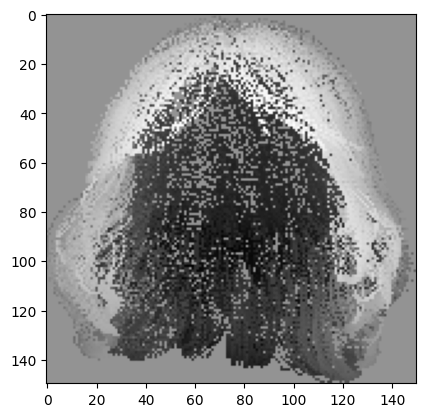

In [13]:
z_values_rotated = np.rot90(z_values, 1)
import matplotlib.pyplot as plt

# Display the rotated grayscale image
plt.imshow(z_values_rotated, cmap='gray')
plt.show()


In [14]:
import cv2

def mouse_click(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:
        print("Depth at ({}, {}): {}".format(x, y, param[y, x]))

# Convert the numpy array to uint8 type to work well with OpenCV imshow.
# You may need to normalize or scale the depth values to fit within the 0-255 range.
z_values_normalized = cv2.normalize(z_values_rotated, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

# cv2.imshow('Depth Image', z_values_normalized)
cv2.imshow('Depth Image', z_values_normalized)
cv2.setMouseCallback('Depth Image', mouse_click, z_values_normalized)

# Wait for a key press and then close the image window.
cv2.waitKey(0)
cv2.destroyAllWindows()


Depth at (68, 75): 147
Depth at (89, 94): 147
Depth at (105, 85): 32
Depth at (96, 69): 38
Depth at (73, 51): 36
Depth at (55, 48): 47
Depth at (50, 34): 246
Depth at (39, 40): 222
Depth at (30, 72): 129
Depth at (23, 89): 157
Depth at (22, 108): 186
Depth at (7, 95): 135
Depth at (17, 87): 183
Depth at (22, 72): 178
Depth at (10, 22): 147
Depth at (12, 10): 147
Depth at (38, 6): 147
Depth at (126, 4): 147
Depth at (98, 85): 147
Depth at (73, 85): 44
Depth at (79, 104): 147
Depth at (90, 112): 53
Depth at (133, 121): 154
Depth at (120, 131): 147
